In [259]:
import tensorflow as tf
import time
import os
import numpy as np
import matplotlib.pyplot as plt
plt.style.use("ggplot")
from tqdm import tqdm
import cv2
import tifffile
from skimage.transform import resize
from skimage import color, exposure
######################################
######################################
######################################
######################################
import warnings

# Filter FutureWarnings
warnings.filterwarnings("ignore", category=FutureWarning, module="sklearn")
warnings.filterwarnings("ignore", category=UserWarning, module="skimage")

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'  # Sets TensorFlow logging level to suppress INFO messages
######################################
######################################
######################################
######################################

image_counter = 0

print(tf.version)

# Set some parameters
im_width = 512
im_height = 512
channels_img = 3
channels_mask = 3

OUTPUT_CHANNELS = 6
BATCH_SIZE = 8
#Batch_SIZE adjustment ==> was 15
EPOCHS = 500
model_size = 64
BUFFER_SIZE = 100
output_path = 'CGAN_P2V/without loss/'

<module 'tensorflow._api.v2.version' from '/data/software/python-libs/3.0.0/envs/tensorflow-2.11-gpu/lib/python3.9/site-packages/tensorflow/_api/v2/version/__init__.py'>


In [77]:
def random_crop(image):
    #for images, masks
    if image.shape[-1] == 3:
        cropped_image = tf.image.random_crop(
            image, size=[im_height, im_width, 3])

    #for dsms(single channeled)
    else:
        cropped_image = tf.image.random_crop(
            image, size=[im_height, im_width])
        
    return cropped_image

@tf.function()
def random_jitter(input_image):
    if input_image.shape[-1] == 3:
        new_w = int(1.1 * im_width)
        new_h = int(1.1 * im_height)

        input_image = tf.image.resize(input_image, [new_w, new_h], method=tf.image.ResizeMethod.BILINEAR)

        # Random cropping back to 256x256
        input_image = random_crop(input_image)

        if tf.random.uniform(()) > 0.5:
            # Random mirroring
            input_image = tf.image.flip_left_right(input_image)

        if tf.random.uniform(()) > 0.5:
            # Random rotation
            input_image = tf.image.rot90(input_image, k=1)
    else:
        # Add any specific processing for DSM images here.
        # For example, you can apply normalization or any other operations.
        # Since you want to keep DSM data as it is, you might not need any additional processing here.
        pass

    return input_image
    
def preprocess_image_train(image, normalized=True):
    image = random_jitter(image)
    
    #if not floor-normalized:
    if not normalized:
        image = normalize(image)
        
    return image

def normalize(data):
    min_value = np.min(data)
    max_value = np.max(data)

    normalized_data = 2 * (data - min_value) / (max_value - min_value) - 1

    return normalized_data

In [126]:
#load numpy array
X_P = np.load("Selected_Images/Subset_Clipped_Potsdam/X_P.npy")
y_P = np.load("Selected_Images/Subset_Clipped_Potsdam/y_P.npy")
z_P = np.load("Selected_Images/Subset_Clipped_Potsdam/z_P.npy")
X_V = np.load("Selected_Images/Subset_Clipped_Vaihingen/X_V.npy")
y_V = np.load("Selected_Images/Subset_Clipped_Vaihingen/y_V.npy")
z_V = np.load("Selected_Images/Subset_Clipped_Vaihingen/z_V.npy")

In [131]:
# Define pixel value mappings
tree = (0, 255, 0)  # Target pixel value to be replaced with 'low_vegetation'
car = (255, 255, 0)             # Target pixel value to be replaced with 'cluster'

low_vegetation = (0, 255, 255)
cluster = (255, 255, 255)

#building (255,0,0)
#tree = (0,255,0)


# Create a lambda function to replace pixels
replace_pixels = lambda img: np.where(np.all(img == low_vegetation, axis=-1, keepdims=True), tree,
                                      np.where(np.all(img == car, axis=-1, keepdims=True), cluster, img))

# Apply the lambda function to all images in the modified_y array
modified_y_P = np.array([replace_pixels(img) for img in y_P])
modified_y_V = np.array([replace_pixels(img) for img in y_V])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


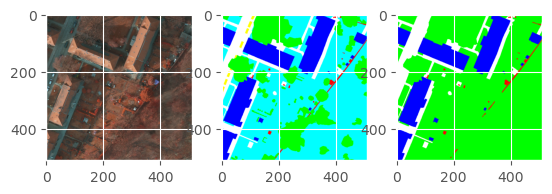

In [132]:
plt.subplot(1,3,1)
plt.imshow(X_P[0]*0.5+0.5)

plt.subplot(1,3,2)
plt.imshow(y_P[0])

plt.subplot(1,3,3)
plt.imshow(modified_y_P[0])

In [7]:
#normalize z_V
z_P = normalize(z_P)
z_V = normalize(z_V)

In [8]:
print(len(X_P), len(y_P), len(z_P), len(X_V), len(y_V), len(z_V))
print(X_P.shape)

212 212 212 309 309 309
(212, 512, 512, 3)


In [135]:
image_P_tf = tf.data.Dataset.from_tensor_slices(X_P)
image_V_tf = tf.data.Dataset.from_tensor_slices(X_V)

y_P_tf = tf.data.Dataset.from_tensor_slices(y_P)
y_V_tf = tf.data.Dataset.from_tensor_slices(y_V)

modified_y_P_tf = tf.data.Dataset.from_tensor_slices(modified_y_P)
modified_y_V_tf = tf.data.Dataset.from_tensor_slices(modified_y_V)

dsm_P_tf = tf.data.Dataset.from_tensor_slices(z_P)
dsm_V_tf = tf.data.Dataset.from_tensor_slices(z_V)

# Enumerate the datasets to add an index to each element
image_P_tf = image_P_tf.enumerate()
image_V_tf = image_V_tf.enumerate()
mask_P_tf = y_P_tf.enumerate()
mask_V_tf = y_V_tf.enumerate()
modified_mask_P_tf = modified_y_P_tf.enumerate()
modified_mask_V_tf = modified_y_V_tf.enumerate()
dsm_P_tf = dsm_P_tf.enumerate()
dsm_V_tf = dsm_V_tf.enumerate()

# Shuffle the datasets with the same seed to keep the order correspondence
seed = 42
image_pots = image_P_tf.map(lambda idx, img: img).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)
image_vai = image_V_tf.map(lambda idx, img: img).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)

mask_pots = mask_P_tf.map(lambda idx, label: label).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)
mask_vai = mask_V_tf.map(lambda idx, label: label).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)

modified_mask_pots = modified_mask_P_tf.map(lambda idx, label: label).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)
modified_mask_vai = modified_mask_V_tf.map(lambda idx, label: label).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)

dsm_pots = dsm_P_tf.map(lambda idx, dsm: dsm).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)
dsm_vai = dsm_V_tf.map(lambda idx, dsm: dsm).shuffle(BUFFER_SIZE, seed=seed).batch(BATCH_SIZE)


#One sample has 8 batch size(for 1 iteration)
sample_pots = next(iter(image_pots))
sample_vai = next(iter(image_vai))

sample_mask_pots = next(iter(mask_pots))
sample_mask_vai = next(iter(mask_vai))

sample_modified_mask_pots = next(iter(modified_mask_pots))
sample_modified_mask_vai = next(iter(modified_mask_vai))

sample_dsm_pots = next(iter(dsm_pots))
sample_dsm_vai = next(iter(dsm_vai))

2023-08-10 12:16:07.400500: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.402072: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.403333: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.407440: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.412408: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.414013: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.415302: I tensorflow/core/grappler/optimizers/data/replicate_on_split.cc:32] Running replicate on split optimization
2023-08-10 12:16:07.416553: I tensorflow/

In [136]:
#####################################
####Call Unet and Generator
#####################################

unet_v = tf.keras.models.load_model('Selected_Images/Subset_Clipped_Vaihingen/UNet_Vaihingen.h5')  # creates a HDF5 file 'my_model.h5'
updated_unet_v = tf.keras.models.load_model('Selected_Images/Subset_Clipped_Vaihingen/updated_UNet_Vaihingen.h5')  # creates a HDF5 file 'my_model.h5'
generator_g = tf.keras.models.load_model('CGAN_P2V/without loss/Generator_G_P2V_64')

mask_modified_unet_v = tf.keras.models.load_model('Selected_Images/Subset_Clipped_Vaihingen/maskmodified_UNet_Vaihingen.h5')  # creates a HDF5 file 'my_model.h5'

to_vai = generator_g(sample_pots)

In [137]:
def tensorify(image):
    resized_image = tf.image.resize(image, size=(256, 256))
    expanded_image = tf.expand_dims(resized_image, axis=0)
    return expanded_image

In [233]:
# Define the color palette
color_palette = np.array([
    [255,255,0],#car
    [0,255,255],#low vegetables
    [0,255,0],#tree
    [255,0,0],#impervious ground
    [255,255,255],#cluster/backbround
    [0,0,255] #building
], dtype=np.uint8)
#should follow this order
#0:car ==>yellow(255,255,0)
#1:low_vegetation ==>aqua(0,255,255)
#2:trees ==>green(0,255,0)
#3:impervious surface ==> red(255,0,0)
#4:cluster/background ==> white(255,255,255)
#5:building ==> blue(0,0,255)

def to_rgb(image):
    # Apply color palette to segmented image
    np_segmented_image = image[0].numpy()  
    argmax_image = np.argmax(np_segmented_image, axis=-1)
    rgb_image = color_palette[argmax_image]
    return rgb_image

In [243]:
# Define the color palette
modified_color_palette = np.array([
    [0,255,255],#low vegetables
    [255,0,0],#impervious ground
    [255,255,255],#cluster/backbround
    [0,0,255] #building
], dtype=np.uint8)


def modified_to_rgb(image):
    # Apply color palette to segmented image
    np_segmented_image = image[0].numpy()
        
    argmax_image = np.argmax(np_segmented_image, axis=-1)
    rgb_image = color_palette[argmax_image]
    return rgb_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 255.5, 255.5, -0.5)

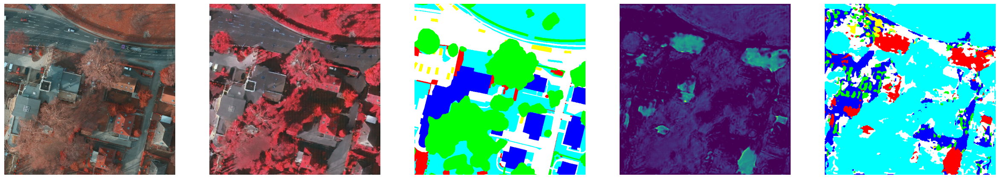

In [245]:
plt.figure(figsize=(30,30))
plt.subplot(1,5,1)
plt.imshow(store_image_pots[10][0]*0.5+0.5)
plt.axis('off')
plt.subplot(1,5,2)
plt.imshow(store_nrml_rgb[10][0]*0.5+0.5)
plt.axis('off')
plt.subplot(1,5,3)
plt.imshow(store_mask_pots[10][0])
plt.axis('off')

#checking the order of mask channels to adjust to_rgb function
plt.subplot(1,5,4)
plt.imshow(store_nrml_segmented[10][0][0][:,:,3])
plt.axis('off')
#0:car ==>yellow
#1:low_vegetation ==>aqua
#2:trees ==>green
#3:impervious surface ==> red
#4:cluster/background ==> white
#5:building ==> blue

plt.subplot(1,5,5)
plt.imshow(to_rgb(store_nrml_segmented[10][0]))
plt.axis('off')

In [246]:
from skimage import transform

def calculate_iou(pred_mask, true_mask):
    # Resize the predicted and ground truth masks to 256x256
    pred_mask_resized = transform.resize(pred_mask, (256, 256), mode='constant', anti_aliasing=True)
    true_mask_resized = transform.resize(true_mask, (256, 256), mode='constant', anti_aliasing=True)

    intersection = np.logical_and(pred_mask_resized, true_mask_resized).sum()
    union = np.logical_or(pred_mask_resized, true_mask_resized).sum()
    iou = intersection / (union + 1e-6)  # Adding a small epsilon to avoid division by zero
    return iou

In [247]:
#Method 1 : pixel-wise Histogram Equalization


from skimage import color, exposure

def histogram_equalization(image):
    # Perform histogram equalization on the image
    #equalized_image = exposure.equalize_hist(image, mask_range(-1, 1))
    equalized_image = exposure.equalize_hist(image)#, mask_range(-1, 1))
    
    return equalized_image


def apply_pxl_comparison(to_vai, sample_dsm_pots):
    
    nrml_segmented = []
    pxl_rgb = []
    pxl_segmented = []
    updated_nrml_segmented = []
    updated_pxl_segmented = []
    mask_modified_nrml_segmented = []
    mask_modified_pxl_segmented = []
    
    for i in range(len(to_vai)):
        rgb_image = to_vai[i].numpy()
        dsm_data = sample_dsm_pots[i].numpy()

        # Define a scalar factor to adjust the intensity based on the elevation
        intensity_factor = 0.2 #was 0.5
        #test range: 0.1~ 1.0 (1.0 was too intense )

        # Perform histogram equalization on the RGB image
        enhanced_image = histogram_equalization(rgb_image)
        # Perform histogram equalization on the DSM data
        enhanced_dsm_data = histogram_equalization(dsm_data)

        # Adjust all channels of the RGB image using enhanced DSM data
        for channel in range(3):
            enhanced_image[:, :, channel] += enhanced_dsm_data * intensity_factor
    
        # Clip the values to ensure they are within the valid range [-1, 1]
        enhanced_image = np.clip(enhanced_image, -1, 1)

        segmented = unet_v(tensorify(rgb_image))
        enhanced_segmented = unet_v(tensorify(enhanced_image))
        updated_segmented = updated_unet_v(tensorify(rgb_image))
        updated_enhanced_segmented = updated_unet_v(tensorify(enhanced_image))
        mask_modified_segmented = mask_modified_unet_v(tensorify(rgb_image))
        mask_modified_enhanced_segmented = mask_modified_unet_v(tensorify(enhanced_image))
        
        #plt.imshow(to_rgb(difference_map))  # You can also display the difference map as before
        #plt.title("difference map: segmented vs enhanced segmented")

        pxl_rgb.append(enhanced_image)
        nrml_segmented.append(segmented)
        pxl_segmented.append(enhanced_segmented)
        updated_nrml_segmented.append(updated_segmented)
        updated_pxl_segmented.append(updated_enhanced_segmented)
        mask_modified_nrml_segmented.append(mask_modified_segmented)
        mask_modified_pxl_segmented.append(mask_modified_enhanced_segmented)
        
    return nrml_segmented, pxl_rgb, pxl_segmented, updated_nrml_segmented, updated_pxl_segmented, mask_modified_nrml_segmented, mask_modified_pxl_segmented

In [272]:
#Method 2 : neighbor-wise comparison: Equalization

from scipy.signal import convolve2d
from skimage import color, exposure

# Define the neighborhood size (e.g., 3x3 window)
### this is to be decided
neighborhood_size = 20

# Define the kernel for the neighborhood-wise comparison
kernel = np.ones((neighborhood_size, neighborhood_size), dtype=np.float32) / (neighborhood_size ** 2)

def neighborhood_comparison(image1, image2):
    # Convert the images to grayscale for comparison
    gray_image1 = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    gray_image2 = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)

    # Compute the absolute difference between the two images in the local neighborhood
    diff = np.abs(convolve2d(gray_image1 - gray_image2, kernel, mode='same'))

    return diff

# Assuming you have the 'to_vai' and 'sample_dsm_pots' lists of cycled images and DSM data

def apply_nbr_comparison(to_vai, sample_dsm_pots):

    nbr_rgb = []
    nbr_segmented = []
    updated_nbr_segmented = []
    mask_modified_nbr_segmented = []
    
    intensity_factor = 0.2 #was 0.5


    for i in range(len(to_vai)):
        rgb_image = to_vai[i].numpy()
        dsm_data = sample_dsm_pots[i].numpy()

        # Rescale the DSM data to the range [0, 255] and convert to 8-bit unsigned
        dsm_data_normalized = ((dsm_data + 1) / 2 * 255).astype(np.uint8)

        # Perform histogram equalization on the RGB image
        enhanced_image = histogram_equalization(rgb_image)
    
        # Perform histogram equalization on the DSM data
        enhanced_dsm_data = histogram_equalization(dsm_data_normalized)
    
        # Adjust all channels of the RGB image using enhanced DSM data
        for channel in range(3):
            enhanced_image[:, :, channel] += enhanced_dsm_data * intensity_factor

        # Clip the values to ensure they are within the valid range [-1, 1]
        enhanced_image = np.clip(enhanced_image, -1, 1)
        enhanced_segmented = unet_v(tensorify(enhanced_image))
        updated_enhanced_segmented = updated_unet_v(tensorify(enhanced_image))
        mask_modified_enhanced_segmented = mask_modified_unet_v(tensorify(enhanced_image))

        nbr_rgb.append(enhanced_image)
        nbr_segmented.append(enhanced_segmented)
        updated_nbr_segmented.append(updated_enhanced_segmented)
        mask_modified_nbr_segmented.append(mask_modified_enhanced_segmented)

        
    return nbr_rgb, nbr_segmented, updated_nbr_segmented, mask_modified_nbr_segmented

In [273]:
#Method 3: nbr + Kmeans clustering
from sklearn.cluster import KMeans

def kmeans(image, num_clusters):
    # Reshape the image to a 2D array (pixels x features)
    pixels = image.reshape(-1, image.shape[-1])

    # Apply k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(pixels)

    # Get the cluster centroids and labels
    centroids = kmeans.cluster_centers_
    labels = kmeans.labels_

    # Assign each pixel to the nearest cluster centroid
    clustered_image = centroids[labels]

    # Reshape the clustered image back to its original shape
    clustered_image = clustered_image.reshape(image.shape)

    return clustered_image

num_clusters = 5

def apply_kmeans(pxl_rgb, nbr_rgb):
    k_pxl_rgb = kmeans(np.array(pxl_rgb), num_clusters)
    k_pxl_segmented = []
    updated_k_pxl_segmented = []
    mask_modified_k_pxl_segmented = []

    k_nbr_rgb = kmeans(np.array(nbr_rgb), num_clusters)
    k_nbr_segmented = []
    updated_k_nbr_segmented = []
    mask_modified_k_nbr_segmented = []

    for pxl_image, nbr_image in zip(k_pxl_rgb, k_nbr_rgb):
        # Perform the desired operations on the clustered images using unet_v(tensorify(image))
        temp_pxl_segmented = unet_v(tensorify(pxl_image))
        k_pxl_segmented.append(temp_pxl_segmented)

        temp_nbr_segmented = unet_v(tensorify(nbr_image))
        k_nbr_segmented.append(temp_nbr_segmented)
    
        updated_temp_pxl_segmented = updated_unet_v(tensorify(pxl_image))
        updated_k_pxl_segmented.append(updated_temp_pxl_segmented)

        updated_temp_nbr_segmented = updated_unet_v(tensorify(nbr_image))
        updated_k_nbr_segmented.append(updated_temp_nbr_segmented)
        
        mask_modified_temp_pxl_segmented = mask_modified_unet_v(tensorify(pxl_image))
        mask_modified_k_pxl_segmented.append(mask_modified_temp_pxl_segmented)

        mask_modified_temp_nbr_segmented = mask_modified_unet_v(tensorify(nbr_image))
        mask_modified_k_nbr_segmented.append(mask_modified_temp_nbr_segmented)
    return k_pxl_rgb, k_pxl_segmented, updated_k_pxl_segmented, k_nbr_rgb, k_nbr_segmented, updated_k_nbr_segmented, mask_modified_k_pxl_segmented, mask_modified_k_nbr_segmented

In [274]:
#모두 다에게 하고 가장 높은 것들만 뽑아보자!

ip = iter(image_pots)
mp = iter(mask_pots)
mmp = iter(modified_mask_pots)
dp = iter(dsm_pots)

store_image_pots = []
store_mask_pots = []
store_modified_mask_pots = []
store_nrml_segmented = []
store_pxl_segmented = []
store_nbr_segmented = []
store_k_pxl_segmented = []
store_k_nbr_segmented = []
store_up_nrml_segmented = []
store_up_pxl_segmented = []
store_up_nbr_segmented = []
store_up_k_pxl_segmented = []
store_up_k_nbr_segmented = []
store_modified_nrml_segmented = []
store_modified_pxl_segmented = []
store_modified_nbr_segmented = []
store_modified_k_pxl_segmented = []
store_modified_k_nbr_segmented = []

store_nrml_rgb = []
store_pxl_rgb = []
store_nbr_rgb = []
store_k_pxl_rgb = []
store_k_nbr_rgb = []


iou_nrml = []
iou_pxl = []
iou_nbr = []
iou_k_pxl = []
iou_k_nbr = []

up_iou_nrml = []
up_iou_pxl = []
up_iou_nbr = []
up_iou_k_pxl = []
up_iou_k_nbr = []

modified_iou_nrml = []
modified_iou_pxl = []
modified_iou_nbr = []
modified_iou_k_pxl = []
modified_iou_k_nbr = []

total_iterations = len(image_pots)  # Update this with the appropriate total number of iterations

for count, (next_ip, next_mp, next_mmp, next_dp) in tqdm(enumerate(zip(ip, mp, mmp, dp)), total=total_iterations, desc="Processing"):
        to_vai = generator_g(next_ip)
    
        nrml_segmented, pxl_rgb, pxl_segmented, up_nrml_segmented, up_pxl_segmented, modified_nrml_segmented, modified_pxl_segmented = apply_pxl_comparison(to_vai, next_dp)
        nbr_rgb, nbr_segmented, up_nbr_segmented, modified_nbr_segmented = apply_nbr_comparison(to_vai, next_dp)
        k_pxl_rgb, k_pxl_segmented, up_k_pxl_segmented, k_nbr_rgb, k_nbr_segmented, up_k_nbr_segmented,modified_k_pxl_segmented, modified_k_nbr_segmented = apply_kmeans(pxl_rgb, nbr_rgb)
        
        for i in range(len(next_ip)):
            iou_nrml.append(calculate_iou(to_rgb(nrml_segmented[i]),sample_mask_pots[i]))
            iou_pxl.append(calculate_iou(to_rgb(pxl_segmented[i]),sample_mask_pots[i]))
            iou_nbr.append(calculate_iou(to_rgb(nbr_segmented[i]),sample_mask_pots[i]))
            iou_k_pxl.append(calculate_iou(to_rgb(k_pxl_segmented[i]),sample_mask_pots[i]))
            iou_k_nbr.append(calculate_iou(to_rgb(k_nbr_segmented[i]),sample_mask_pots[i]))
            
            up_iou_nrml.append(calculate_iou(to_rgb(up_nrml_segmented[i]),sample_mask_pots[i]))
            up_iou_pxl.append(calculate_iou(to_rgb(up_pxl_segmented[i]),sample_mask_pots[i]))
            up_iou_nbr.append(calculate_iou(to_rgb(up_nbr_segmented[i]),sample_mask_pots[i]))
            up_iou_k_pxl.append(calculate_iou(to_rgb(up_k_pxl_segmented[i]),sample_mask_pots[i]))
            up_iou_k_nbr.append(calculate_iou(to_rgb(up_k_nbr_segmented[i]),sample_mask_pots[i]))
        
            modified_iou_nrml.append(calculate_iou(modified_to_rgb(modified_nrml_segmented[i]),sample_modified_mask_pots[i]))
            modified_iou_pxl.append(calculate_iou(modified_to_rgb(modified_pxl_segmented[i]),sample_modified_mask_pots[i]))
            modified_iou_nbr.append(calculate_iou(modified_to_rgb(modified_nbr_segmented[i]),sample_modified_mask_pots[i]))
            modified_iou_k_pxl.append(calculate_iou(modified_to_rgb(modified_k_pxl_segmented[i]),sample_modified_mask_pots[i]))
            modified_iou_k_nbr.append(calculate_iou(modified_to_rgb(modified_k_nbr_segmented[i]),sample_modified_mask_pots[i]))
        
        store_image_pots.append(next_ip)
        store_mask_pots.append(next_mp)
        store_modified_mask_pots.append(next_mmp)
        store_nrml_segmented.append(nrml_segmented)
        store_pxl_segmented.append(pxl_segmented)
        store_nbr_segmented.append(nbr_segmented)
        store_k_pxl_segmented.append(k_pxl_segmented)
        store_k_nbr_segmented.append(k_nbr_segmented)
        store_up_nrml_segmented.append(up_nrml_segmented)
        store_up_pxl_segmented.append(up_pxl_segmented)
        store_up_nbr_segmented.append(up_nbr_segmented)
        store_up_k_pxl_segmented.append(up_k_pxl_segmented)
        store_up_k_nbr_segmented.append(up_k_nbr_segmented)
        store_modified_nrml_segmented.append(modified_nrml_segmented)
        store_modified_pxl_segmented.append(modified_pxl_segmented)
        store_modified_nbr_segmented.append(modified_nbr_segmented)
        store_modified_k_pxl_segmented.append(modified_k_pxl_segmented)
        store_modified_k_nbr_segmented.append(modified_k_nbr_segmented)
        store_nrml_rgb.append(to_vai)
        store_pxl_rgb.append(pxl_rgb)
        store_nbr_rgb.append(nbr_rgb)
        store_k_pxl_rgb.append(k_pxl_rgb)
        store_k_nbr_rgb.append(k_nbr_rgb)

Processing: 100%|██████████| 27/27 [10:39<00:00, 23.69s/it]


In [275]:
def get_top_5_indices_and_values(arr):
    # Create a copy of the original array
    sorted_arr = arr.copy()
    # Sort the copy in descending order
    sorted_arr.sort(reverse=True)

    top_5_indices = []
    top_5_values = []

    for i in range(5):
        value = sorted_arr[i]
        # Find the index of the value in the original array
        index = arr.index(value)
        top_5_indices.append(index)
        top_5_values.append(value)

    return top_5_values, top_5_indices

# Example usage:
my_array = [1.1, 5.5, 3.3, 2.41223, 0, 23.51]
indices, values = get_top_5_indices_and_values(my_array)
print("Indices of top 5 highest elements:", indices)
print("Values of top 5 highest elements:", values)

Indices of top 5 highest elements: [23.51, 5.5, 3.3, 2.41223, 1.1]
Values of top 5 highest elements: [5, 1, 2, 3, 0]


In [292]:
# Get the index and value of the top 5 highest elements

values_k_nbr_top_5, indexes_k_nbr_top_5 = get_top_5_indices_and_values(iou_k_nbr)
values_up_k_nbr_top_5, indexes_up_k_nbr_top_5 = get_top_5_indices_and_values(up_iou_k_nbr)
values_modified_k_nbr_top_5, indexes_modified_k_nbr_top_5 = get_top_5_indices_and_values(modified_iou_k_nbr)

values_k_pxl_top_5, indexes_k_pxl_top_5 = get_top_5_indices_and_values(iou_k_pxl)
values_up_k_pxl_top_5, indexes_up_k_pxl_top_5 = get_top_5_indices_and_values(up_iou_k_pxl)
values_modified_k_pxl_top_5, indexes_modified_k_pxl_top_5 = get_top_5_indices_and_values(modified_iou_k_pxl)

def format_float(number):
    return "{:.4f}".format(number)

# Print indexes and formatted values of k_nbr
print("Indexes of k_nbr:", indexes_k_nbr_top_5)
print("Values of k_nbr:", [format_float(value) for value in values_k_nbr_top_5])

# Print indexes and formatted values of up_k_nbr
print("Indexes of up_k_nbr:", indexes_up_k_nbr_top_5)
print("Values of up_k_nbr:", [format_float(value) for value in values_up_k_nbr_top_5])

# Print indexes and formatted values of modified_k_nbr
print("Indexes of modified_k_nbr:", indexes_modified_k_nbr_top_5)
print("Values of modified_k_nbr:", [format_float(value) for value in values_modified_k_nbr_top_5])

print("##############")

# Print indexes and formatted values of k_pxl
print("Indexes of k_pxl:", indexes_k_pxl_top_5)
print("Values of k_pxl:", [format_float(value) for value in values_k_pxl_top_5])

# Print indexes and formatted values of up_k_pxl
print("Indexes of up_k_pxl:", indexes_up_k_pxl_top_5)
print("Values of up_k_pxl:", [format_float(value) for value in values_up_k_pxl_top_5])

# Print indexes and formatted values of modified_k_pxl
print("Indexes of modified_k_pxl:", indexes_modified_k_pxl_top_5)
print("Values of modified_k_pxl:", [format_float(value) for value in values_modified_k_pxl_top_5])

Indexes of k_nbr: [76, 43, 90, 18, 157]
Values of k_nbr: ['0.6547', '0.6205', '0.6066', '0.6054', '0.6046']
Indexes of up_k_nbr: [76, 43, 157, 90, 78]
Values of up_k_nbr: ['0.6472', '0.6294', '0.6090', '0.6035', '0.5998']
Indexes of modified_k_nbr: [176, 76, 18, 14, 69]
Values of modified_k_nbr: ['0.5235', '0.5227', '0.5186', '0.5167', '0.5156']
##############
Indexes of k_pxl: [76, 43, 90, 122, 18]
Values of k_pxl: ['0.6462', '0.6234', '0.6095', '0.6067', '0.6066']
Indexes of up_k_pxl: [76, 43, 18, 157, 90]
Values of up_k_pxl: ['0.6416', '0.6144', '0.6096', '0.6076', '0.5993']
Indexes of modified_k_pxl: [43, 176, 90, 18, 14]
Values of modified_k_pxl: ['0.5295', '0.5167', '0.5147', '0.5145', '0.5104']


In [277]:
#2D array
print(len(store_nbr_segmented))
print(len(store_nbr_segmented[0]))

27
8


In [278]:
np.max(iou_k_nbr)

0.6546847734505392

In [279]:
#make an image array of top 5 for each of below.

top_5_sample_pots = []
top_5_nrml_segmented = []
top_5_pxl_segmented = []
top_5_k_pxl_segmented = []
top_5_nbr_segmented = []
top_5_k_nbr_segmented = []
##with updated resUnet
top_5_up_nrml_segmented = []
top_5_up_pxl_segmented = []
top_5_up_k_pxl_segmented = []
top_5_up_nbr_segmented = []
top_5_up_k_nbr_segmented = []
##with mask updated resUnet
top_5_modified_nrml_segmented = []
top_5_modified_pxl_segmented = []
top_5_modified_k_pxl_segmented = []
top_5_modified_nbr_segmented = []
top_5_modified_k_nbr_segmented = []

top_5_nrml_rgb = []
top_5_pxl_rgb = []
top_5_nbr_rgb = []
top_5_k_pxl_rgb = []
top_5_k_nbr_rgb = []



#sort by k_nbr
for i in indexes_k_nbr_top_5:
    big_jump = i//BATCH_SIZE
    small_jump = i%BATCH_SIZE
    print(big_jump, small_jump)
    
    top_5_sample_pots.append(store_image_pots[big_jump][small_jump])
    top_5_nrml_segmented.append(store_nrml_segmented[big_jump][small_jump])
    top_5_pxl_segmented.append(store_pxl_segmented[big_jump][small_jump])
    top_5_k_pxl_segmented.append(store_k_pxl_segmented[big_jump][small_jump])
    top_5_nbr_segmented.append(store_nbr_segmented[big_jump][small_jump])
    top_5_k_nbr_segmented.append(store_k_nbr_segmented[big_jump][small_jump])
    ##with updated resUnet
    top_5_up_nrml_segmented.append(store_up_nrml_segmented[big_jump][small_jump])
    top_5_up_pxl_segmented.append(store_up_pxl_segmented[big_jump][small_jump])
    top_5_up_k_pxl_segmented.append(store_up_k_pxl_segmented[big_jump][small_jump])
    top_5_up_nbr_segmented.append(store_up_nbr_segmented[big_jump][small_jump])
    top_5_up_k_nbr_segmented.append(store_up_k_nbr_segmented[big_jump][small_jump])
    ##with mask updated resUnet
    top_5_modified_nrml_segmented.append(store_modified_nrml_segmented[big_jump][small_jump])
    top_5_modified_pxl_segmented.append(store_modified_pxl_segmented[big_jump][small_jump])
    top_5_modified_k_pxl_segmented.append(store_modified_k_pxl_segmented[big_jump][small_jump])
    top_5_modified_nbr_segmented.append(store_modified_nbr_segmented[big_jump][small_jump])
    top_5_modified_k_nbr_segmented.append(store_modified_k_nbr_segmented[big_jump][small_jump])

    top_5_nrml_rgb.append(store_nrml_rgb[big_jump][small_jump])
    top_5_pxl_rgb.append(store_pxl_rgb[big_jump][small_jump])
    top_5_nbr_rgb.append(store_nbr_rgb[big_jump][small_jump])
    top_5_k_pxl_rgb.append(store_k_pxl_rgb[big_jump][small_jump])
    top_5_k_nbr_rgb.append(store_k_nbr_rgb[big_jump][small_jump])    

9 4
5 3
11 2
2 2
19 5


In [280]:
len(top_5_nbr_segmented)

5

In [324]:
import matplotlib.pyplot as plt

def plot_top_5(sample_pots, nrml_segmented, pxl_segmented, k_pxl_segmented, nbr_segmented, k_nbr_segmented,
               iou_nrml,iou_pxl,iou_nbr,iou_k_pxl,iou_k_nbr,sorting_index_set, title):
    plt.figure(figsize=(20, 18))

    num_rows = 5 #print top 5
    num_columns = 7

    # Define row titles
    row_titles = ["1st", "2nd", "3rd", "4th", "5th"]

    for i in range(num_rows):
        #print(i)
        # Add row title
        plt.subplot(num_rows, num_columns, i*num_columns+1)
        plt.text(0.5, 0.5, row_titles[i], fontsize=12, ha='center', va='center')
        plt.axis('off')  # Hide axis for the title cell
        
        plt.subplot(num_rows, num_columns, i*num_columns+2)
        plt.imshow(sample_pots[i]*0.5+0.5)
        plt.title("original")
        plt.axis('off')
        
        plt.subplot(num_rows, num_columns, i*num_columns+3)
        plt.imshow(to_rgb(nrml_segmented[i]))
        plt.title("p in v\n{:.4f}".format(iou_nrml[sorting_index_set[i]])) #these are sorted by indexes_k_nbr_top_5 or indexes_up_k_nbr_top_5.
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+4)
        plt.imshow(to_rgb(pxl_segmented[i]))
        plt.title("pxl p in v\n{:.4f}".format(iou_pxl[sorting_index_set[i]]))
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+5)
        plt.imshow(to_rgb(k_pxl_segmented[i]))
        plt.title("k+pxl p in v\n{:.4f}".format(iou_k_pxl[sorting_index_set[i]]))
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+6)
        plt.imshow(to_rgb(nbr_segmented[i]))
        plt.title("nbr p in v\n{:.4f}".format(iou_nbr[sorting_index_set[i]]))
        plt.axis('off')


        plt.subplot(num_rows, num_columns, i*num_columns+7)
        plt.imshow(to_rgb(k_nbr_segmented[i]))
        plt.title("k+nbr p in v\n{:.4f}".format(iou_k_nbr[sorting_index_set[i]]))
        plt.axis('off')

    plt.suptitle(title, fontsize=40, y=1.02)  # Increase y value for additional space below the title

    plt.tight_layout()
    plt.show()


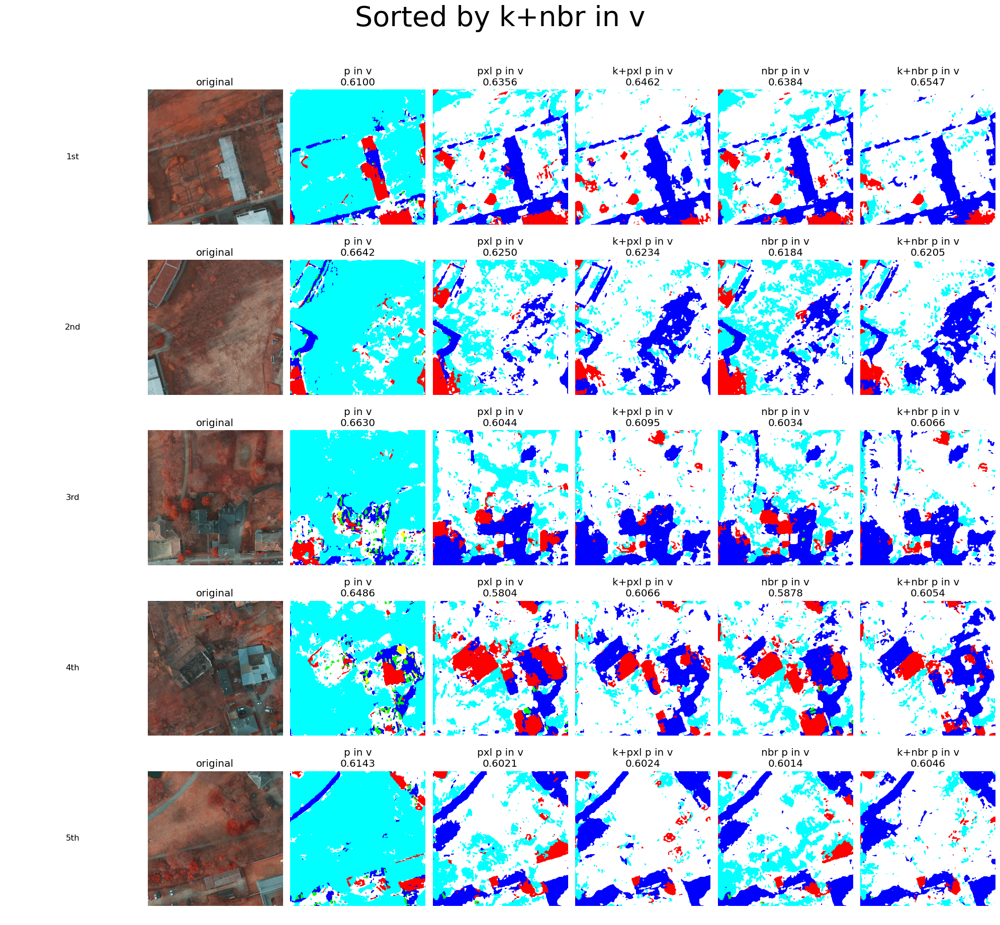

In [325]:
#############
#Sorted by k+nbr in v
#############

plot_top_5(top_5_sample_pots,
            top_5_nrml_segmented,
            top_5_pxl_segmented,
            top_5_k_pxl_segmented,
            top_5_nbr_segmented,
            top_5_k_nbr_segmented,
           iou_nrml,
           iou_pxl,
           iou_nbr,
           iou_k_pxl,
           iou_k_nbr,
          sorting_index_set=indexes_k_nbr_top_5,
          title = "Sorted by k+nbr in v")

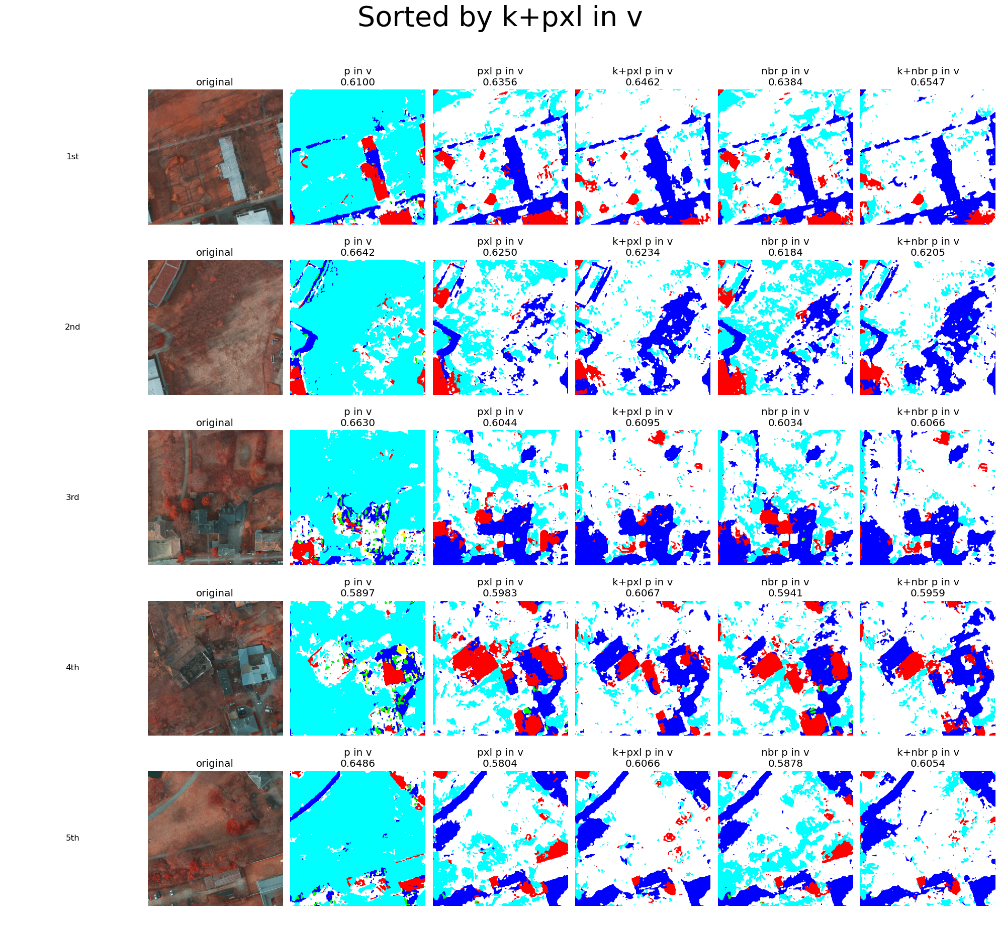

In [326]:
#############
#Sorted by k+pxl in v
#############

plot_top_5(top_5_sample_pots,
            top_5_nrml_segmented,
            top_5_pxl_segmented,
            top_5_k_pxl_segmented,
            top_5_nbr_segmented,
            top_5_k_nbr_segmented,
           iou_nrml,
           iou_pxl,
           iou_nbr,
           iou_k_pxl,
           iou_k_nbr,
          sorting_index_set=indexes_k_pxl_top_5,
          title = "Sorted by k+pxl in v")

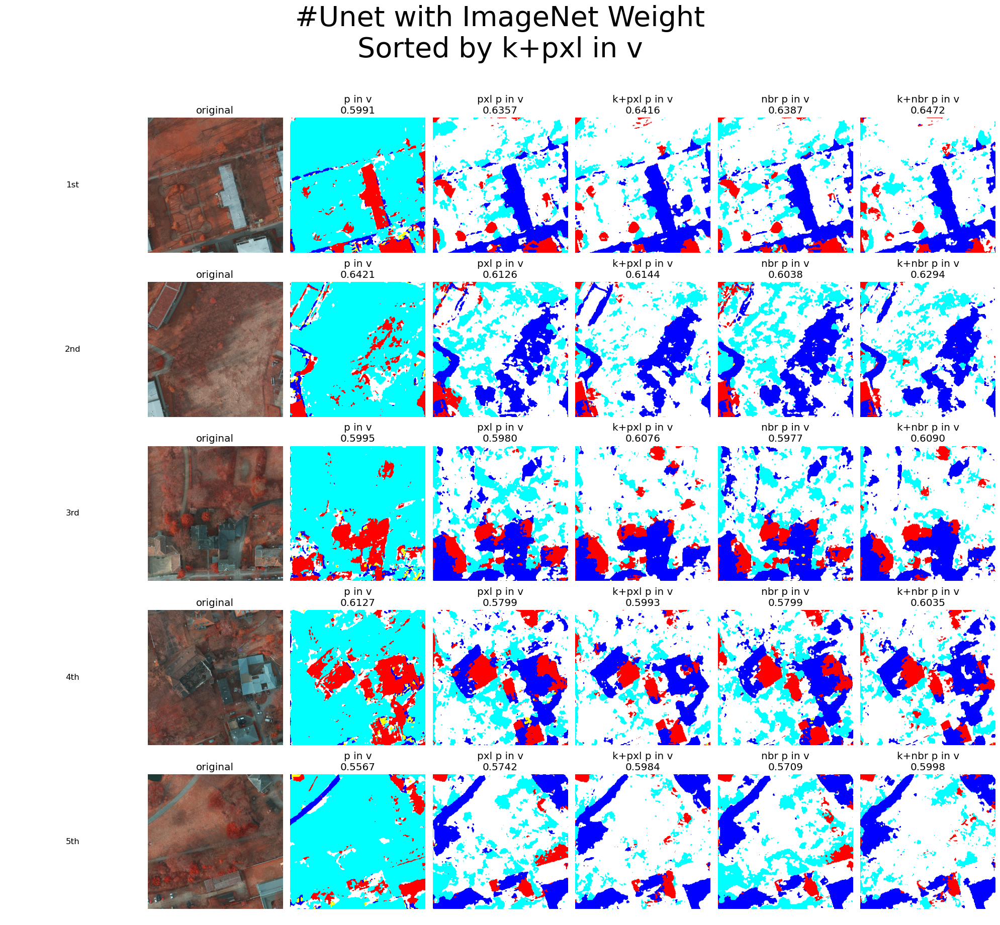

In [327]:
#############
#Unet with ImageNet Weight
#Sorted by k+pxl in v
#############
plot_top_5(top_5_sample_pots,
            top_5_up_nrml_segmented,
            top_5_up_pxl_segmented,
            top_5_up_k_pxl_segmented,
            top_5_up_nbr_segmented,
            top_5_up_k_nbr_segmented,
           up_iou_nrml,
           up_iou_pxl,
           up_iou_nbr,
           up_iou_k_pxl,
           up_iou_k_nbr,
          sorting_index_set=indexes_up_k_nbr_top_5,
          title = "Unet with ImageNet Weight\nSorted by k+pxl in v")

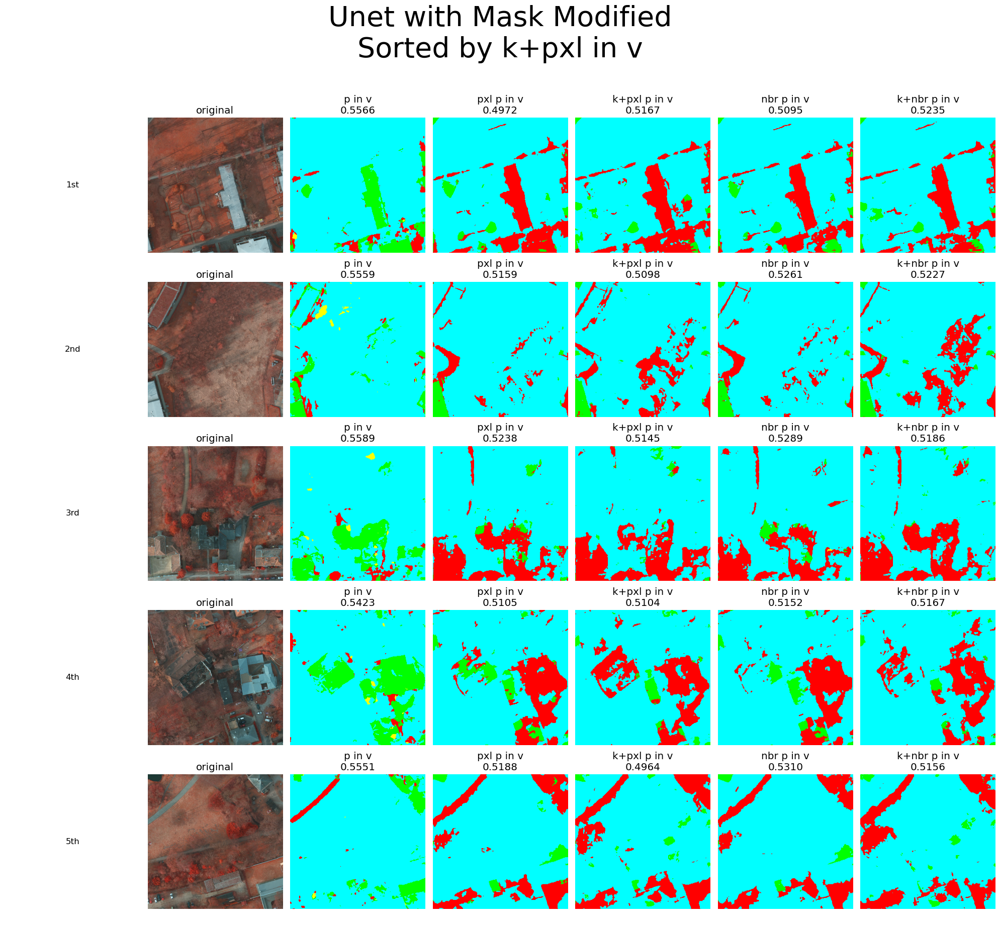

In [329]:
#############
#Unet with Mask Modified
#Sorted by k+pxl in v
#############
plot_top_5(top_5_sample_pots,
            top_5_modified_nrml_segmented,
            top_5_modified_pxl_segmented,
            top_5_modified_k_pxl_segmented,
            top_5_modified_nbr_segmented,
            top_5_modified_k_nbr_segmented,
           modified_iou_nrml,
           modified_iou_pxl,
           modified_iou_nbr,
           modified_iou_k_pxl,
           modified_iou_k_nbr,
          sorting_index_set=indexes_modified_k_nbr_top_5,
          title = "Unet with Mask Modified\nSorted by k+pxl in v")

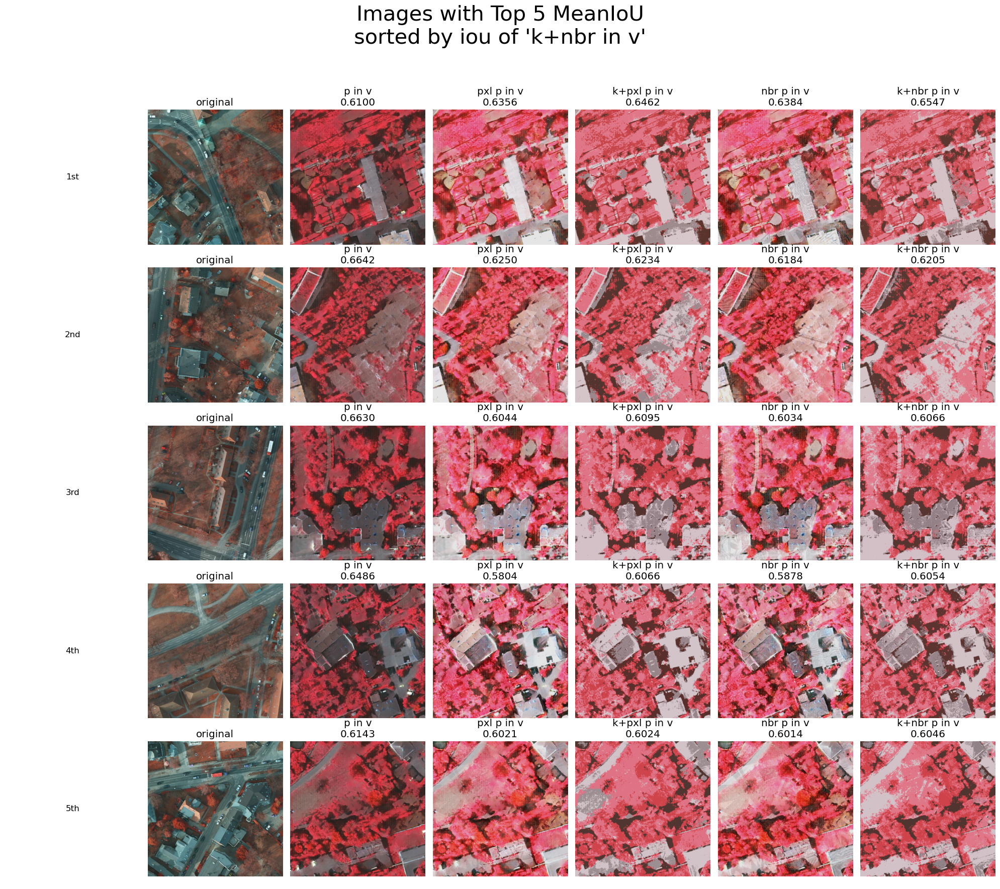

In [287]:
num_rows = 5 #print top 5
num_columns = 7

plt.figure(figsize=(20, 18))


# Define row titles
row_titles = ["1st", "2nd", "3rd", "4th", "5th"]

for i in range(num_rows):
        # Add row title
        plt.subplot(num_rows, num_columns, i*num_columns+1)
        plt.text(0.5, 0.5, row_titles[i], fontsize=12, ha='center', va='center')
        plt.axis('off')  # Hide axis for the title cell
        
        plt.subplot(num_rows, num_columns, i*num_columns+2)
        plt.imshow(sample_pots[i]*0.5+0.5)
        plt.title("original")
        plt.axis('off')
        
        plt.subplot(num_rows, num_columns, i*num_columns+3)
        plt.imshow(top_5_nrml_rgb[i]*0.5+0.5)
        plt.title("p in v\n{:.4f}".format(iou_nrml[indexes_k_nbr_top_5[i]])) #these are sorted by indexes_k_nbr_top_5 or indexes_up_k_nbr_top_5.
        plt.axis('off')
        
        plt.subplot(num_rows, num_columns, i*num_columns+4)
        plt.imshow(top_5_pxl_rgb[i]*0.9)
        plt.title("pxl p in v\n{:.4f}".format(iou_pxl[indexes_k_nbr_top_5[i]])) #these are sorted by indexes_k_nbr_top_5 or indexes_up_k_nbr_top_5.
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+5)
        plt.imshow(top_5_k_pxl_rgb[i]*0.9)
        plt.title("k+pxl p in v\n{:.4f}".format(iou_k_pxl[indexes_k_nbr_top_5[i]]))
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+6)
        plt.imshow(top_5_nbr_rgb[i]*0.9)
        plt.title("nbr p in v\n{:.4f}".format(iou_nbr[indexes_k_nbr_top_5[i]]))
        plt.axis('off')

        plt.subplot(num_rows, num_columns, i*num_columns+7)
        plt.imshow(top_5_k_nbr_rgb[i]*0.9)
        plt.title("k+nbr p in v\n{:.4f}".format(iou_k_nbr[indexes_k_nbr_top_5[i]]))
        plt.axis('off')

    
plt.suptitle("Images with Top 5 MeanIoU\nsorted by iou of 'k+nbr in v'\n\n", fontsize=30)

plt.tight_layout()
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


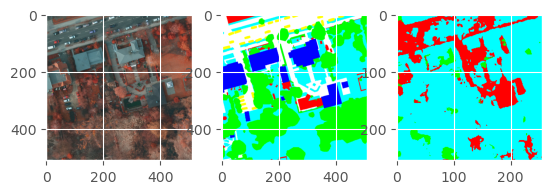

In [288]:
plt.subplot(1,3,1)
plt.imshow(store_image_pots[11][0]*0.5+0.5)

plt.subplot(1,3,2)
plt.imshow(store_mask_pots[11][0])

plt.subplot(1,3,3)
plt.imshow(to_rgb(store_modified_k_nbr_segmented[11][0]))

In [ ]:
####
decide k_means cluster